In [95]:
from utlities.cal_utils import Format, Analyze

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker  # Import ticker module

import seaborn as sns
import math
import scipy

import numpy as np


import os

rep = "1"
path_data = f"./Data/rep{rep}_data.xlsx"
path_md = f"./picker_suggestions_modified/rep{rep}_edited.xlsx"


folder = f"./rep{rep}_data_analysis"

form = Format(path = path_data)
analyze = Analyze()

sns.set_style("darkgrid")
sns.color_palette('colorblind')

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [96]:
if not os.path.exists(folder):

    # if the demo_folder directory is not present
    # then create it.
    os.makedirs(folder)

In [97]:
if not os.path.exists(f'./picker_outputs_rep{rep}/Rep{rep}_df.csv'):

    df = form.tidy_file(delta = False, average = True)
    df.to_csv(f'./picker_outputs_rep{rep}/Rep{rep}_df.csv', index=False)

In [98]:
#load the first exel file in tidy format
df = pd.read_csv(f'./picker_outputs_rep{rep}/Rep{rep}_df.csv')


#the start times selected by chelsea and the end times selected by me
md = pd.read_excel(path_md)


In [99]:
df

,Time (sec),[hr]:[min]:[sec],A.U.,Normalized A.U.,Cell #,Treatment
0,1.295,00:00:01.295000,3.419000,1.066771,Cell 1,NoRTG NoInh - 1 - Islet 1
1,2.590,00:00:02.590000,3.339000,1.041810,Cell 1,NoRTG NoInh - 1 - Islet 1
2,3.885,00:00:04,3.452000,1.077067,Cell 1,NoRTG NoInh - 1 - Islet 1
3,5.180,00:00:05.180000,3.339000,1.041810,Cell 1,NoRTG NoInh - 1 - Islet 1
4,6.475,00:00:06.475000,3.412000,1.064587,Cell 1,NoRTG NoInh - 1 - Islet 1
...,...,...,...,...,...,...
1294592,2363.375,00:39:23.375000,13.186938,5.926713,AVG,10wt% RTG Inh - Islet 2
1294593,2364.670,00:39:24.670000,12.232531,5.497767,AVG,10wt% RTG Inh - Islet 2
1294594,2365.965,00:39:25.965000,11.702500,5.259551,AVG,10wt% RTG Inh - Islet 2
1294595,2367.260,00:39:27.260000,11.891094,5.344312,AVG,10wt% RTG Inh - Islet 2


In [100]:
examp = md[md["Represent"] == True]
examp

,Unnamed: 0,Treatment,11 mM Stimulus,20 mM Stimulus,KCL Stimulus,11 mM End,Example Cells,Represent,End Option 1,End Option 2,End Option 3,Notes,Quality,End 11 mM 2nd Phase,Start 11 mM 2nd Phase,Unnamed: 15,Duty Quality,sample,Unnamed: 18
19,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1353.275,Cell 1,True,1353.275,NaN,NaN,,1,NaN,NaN,NaN,NaN,NaN,NaN
26,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1354.570,Cell 8,True,1001.035,1354.570,NaN,,1,NaN,NaN,NaN,NaN,NaN,NaN
32,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1366.225,Cell 14,True,1366.225,1547.525,NaN,,1,NaN,NaN,NaN,NaN,NaN,NaN
36,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1353.275,Cell 18,True,1353.275,1495.725,NaN,,1,NaN,NaN,NaN,NaN,NaN,NaN
38,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1354.570,Cell 20,True,1354.570,1526.805,NaN,,1,NaN,NaN,NaN,NaN,NaN,NaN
41,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1346.800,AVG,True,1346.800,1539.755,NaN,,3,NaN,NaN,NaN,NaN,NaN,NaN
54,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1533.280,Cell 3,True,1533.280,1807.820,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
56,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1626.520,Cell 5,True,1626.520,1792.280,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
58,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1803.935,Cell 7,True,1669.255,1803.935,2035.740,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
59,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1605.800,Cell 8,True,1605.800,1793.575,2000.775,,1,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
new_dfs = []

for treat in examp.Treatment.unique():
    temp_md = examp[examp.Treatment == treat]
    temp_df = df[df.Treatment == treat]

    cells = temp_md["Example Cells"].unique()
    print(cells)

    temp_df = temp_df[temp_df["Cell #"].isin(cells)]
    new_dfs.append(temp_df)

df = pd.concat(new_dfs)

['Cell 1' 'Cell 8' 'Cell 14' 'Cell 18' 'Cell 20' 'AVG']
['Cell 3' 'Cell 5' 'Cell 7' 'Cell 8' 'Cell 13' 'AVG']
['Cell 1' 'Cell 3' 'Cell 15' 'Cell 18' 'Cell 19' 'AVG']
['Cell 13' 'Cell 14' 'Cell 17' 'Cell 21' 'Cell 23' 'AVG']


In [102]:
df[df["Treatment"]==treat]["Cell #"].unique()

array(['Cell 13', 'Cell 14', 'Cell 17', 'Cell 21', 'Cell 23', 'AVG'],
      dtype=object)

In [103]:
for treat in list(df.Treatment.unique()):
    print(treat)
    print(len(df[df.Treatment == treat]["Cell #"].unique()))

NoRTG NoInh - 1 - Islet 2
6
NoRTG NoInh - 2 - Islet 2
6
5wt% RTG NoInh - Islet 1
6
10wt% RTG NoInh - Islet 2
6


In [104]:
from math import log10, floor
def round_sig(x, sig=1, small_value=1.0e-9):
    rounded = round(x, sig - int(floor(log10(max(abs(x), abs(small_value))))) - 1)

    return rounded

In [105]:
md

,Unnamed: 0,Treatment,11 mM Stimulus,20 mM Stimulus,KCL Stimulus,11 mM End,Example Cells,Represent,End Option 1,End Option 2,End Option 3,Notes,Quality,End 11 mM 2nd Phase,Start 11 mM 2nd Phase,Unnamed: 15,Duty Quality,sample,Unnamed: 18
0,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1169.385,Cell 1,False,1169.385,1377.880,1666.665,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
1,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,629.370,Cell 2,False,629.370,998.445,1528.100,,3,NaN,NaN,NaN,NaN,NaN,NaN
2,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1212.120,Cell 3,False,1212.120,1381.765,1543.640,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
3,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1364.930,Cell 4,False,617.715,1364.930,1563.065,small primary peak,2,NaN,NaN,NaN,NaN,NaN,NaN
4,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1560.000,Cell 5,False,599.585,729.085,1373.995,Custom,3,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1140.000,Cell 34,False,1152.550,1410.255,1721.055,custom,1,NaN,NaN,NaN,NaN,NaN,NaN
223,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1301.475,Cell 35,False,1003.625,1301.475,1555.295,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN
224,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1489.250,Cell 36,False,1489.250,1625.225,1923.075,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN
225,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1197.875,Cell Avg,False,1197.875,1622.635,1946.385,NaN,,NaN,NaN,NaN,NaN,NaN,NaN


In [106]:
if not os.path.exists(f'{folder}/Seperations'): 
      
     # if the demo_folder directory is not present then create it
                        
    os.makedirs(f'{folder}/Seperations')

NoRTG NoInh - 1 - Islet 2
['Cell 1' 'Cell 8' 'Cell 14' 'Cell 18' 'Cell 20' 'AVG']
NoRTG NoInh - 2 - Islet 2
['Cell 3' 'Cell 5' 'Cell 7' 'Cell 8' 'Cell 13' 'AVG']
5wt% RTG NoInh - Islet 1
['Cell 1' 'Cell 3' 'Cell 15' 'Cell 18' 'Cell 19' 'AVG']
10wt% RTG NoInh - Islet 2
['Cell 13' 'Cell 14' 'Cell 17' 'Cell 21' 'Cell 23' 'AVG']


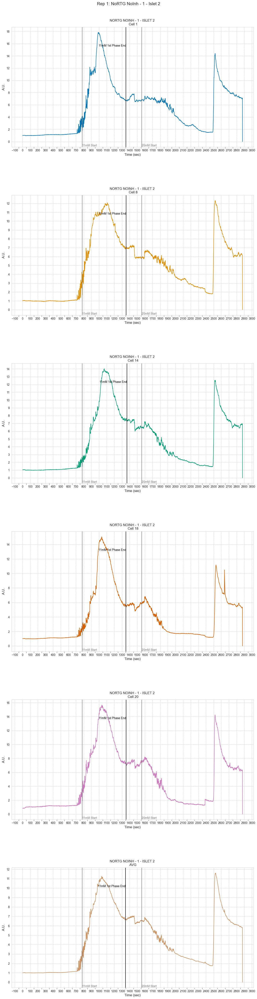

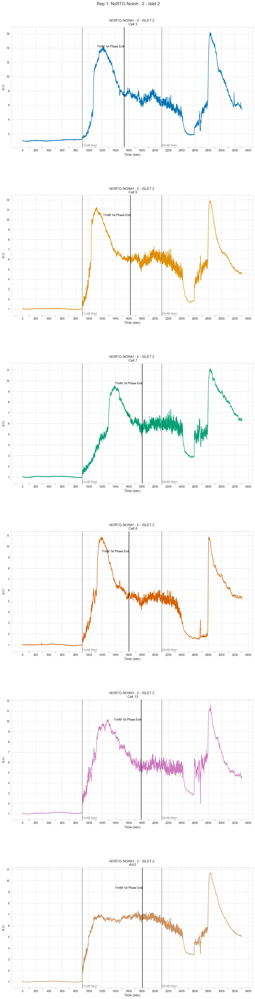

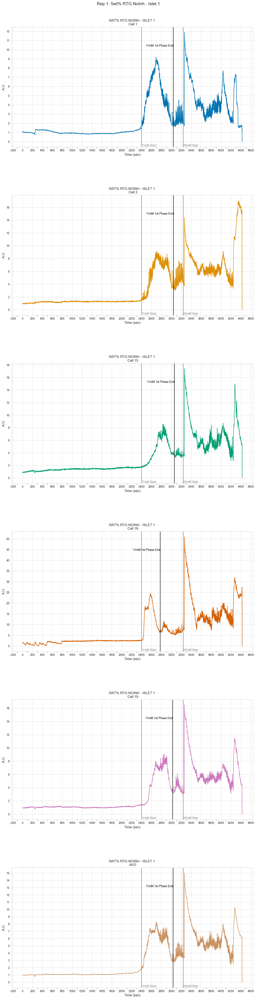

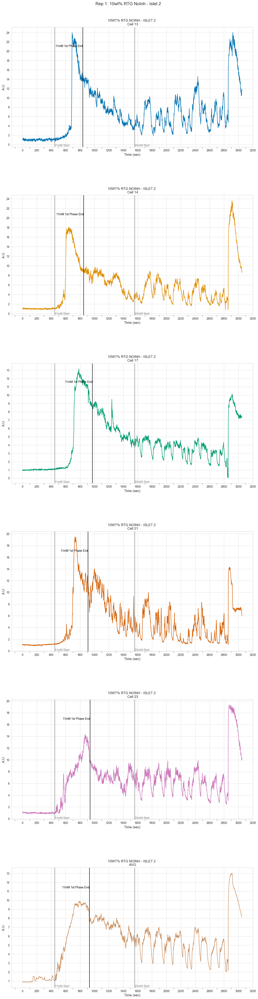

In [107]:
treatments = df.Treatment.unique()
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# loop through the length of tickers and keep track of index
for n, treat in enumerate(treatments):

    temp_df = df[df["Treatment"] == treat]
    temp_md = md[md["Treatment"] == treat]

    cells = temp_df["Cell #"].unique()

    #re-iniitialize the color pallet with each new set of plots:
    palette = sns.color_palette("colorblind", len(cells))

    #initialize plot
    plt.figure(figsize=(15, int(10*len(cells))))
    plt.subplots_adjust(hspace=0.4)
    plt.suptitle(f"Rep {rep}: {treat}", fontsize=15, y=0.9)
    print(treat)
    print(cells)
    for m, cell in enumerate(cells):

        cell_md = temp_md[temp_md["Example Cells"] == cell]
        plot_df = temp_df[temp_df["Cell #"] == cell]

        col_num = 1
        ax = plt.subplot(int(math.ceil(len(cells)/col_num)), col_num, m + 1)



        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("A.U.")
        #ax.legend()
        #ax.get_legend().remove()
        #ax.set_xlabel("")

        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m])
        # Set more frequent ticks on the x-axis

                    #if there is no metadata
        if len(temp_md) == 0:
            print(f"There is no metadata on {treat} so no starts or ends of curves are unknown")
            continue

        #if we have metadata on the cell
        else:
            # filter df and plot ticker on the new subplot axis
            ax.axvline(x=cell_md["11 mM Stimulus"].iloc[0], color='grey')
            ax.axvline(x=cell_md["11 mM End"].iloc[0], color='black')
            ax.axvline(x=cell_md["20 mM Stimulus"].iloc[0], color='grey')

            # Text labels
            y_pos = ax.get_ylim()[0]  # Position at the bottom of the graph
            ax.text(cell_md["11 mM Stimulus"].iloc[0], y_pos, "11mM Start", color='grey', verticalalignment='bottom')
            ax.text(cell_md["11 mM End"].iloc[0], ax.get_ylim()[1]*.85 , "11mM 1st Phase End", color='black', verticalalignment='top', horizontalalignment='right')
            ax.text(cell_md["20 mM Stimulus"].iloc[0], y_pos, "20mM Start", color='grey', verticalalignment='bottom')

            if pd.notna(cell_md["End 11 mM 2nd Phase"].iloc[0]):
                ax.axvline(x=cell_md["End 11 mM 2nd Phase"].iloc[0], color='black')
                ax.text(cell_md["End 11 mM 2nd Phase"].iloc[0], ax.get_ylim()[1]*1 , "11mM 2nd Phase End", color='black', verticalalignment='top', horizontalalignment='left')


        xspacing = int(round_sig((plot_df["Time (sec)"].max() - plot_df["Time (sec)"].min())/20))
        ax.xaxis.set_major_locator(ticker.MultipleLocator(xspacing))  # Adjust the locator value as needed
        yspacing = round_sig((plot_df["Normalized A.U."].max()/10))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(yspacing))
        ax.tick_params(axis='x', labelsize=10)  # Adjust the font size of x-axis tick labels
        ax.tick_params(axis='y', labelsize=10)  # Adjust the font size of x-axis tick labels

        # Enable and enlarge minor ticks for visibility
        ax.minorticks_on()
        # Add minor ticks on the x-axis
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=5)


        ax.set_xlabel("Time (sec)", fontsize=12)
        ax.set_ylabel("A.U.", fontsize=12)
        # chart formatting
        ax.set_title(f"{treat.upper()} \n {cell}")


    plt.savefig(f"{folder}/Seperations/Rep{rep}_{treat}_sep.png", bbox_inches = "tight");






In [108]:
if not os.path.exists(f"{folder}/second_phase"):

    # if the demo_folder directory is not present
    # then create it.

    os.makedirs(f"{folder}/second_phase")

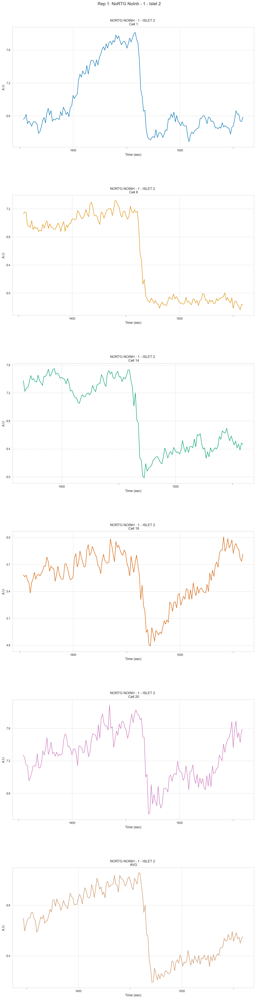

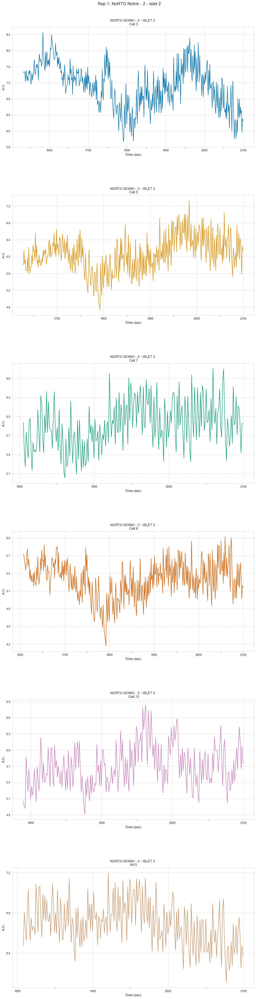

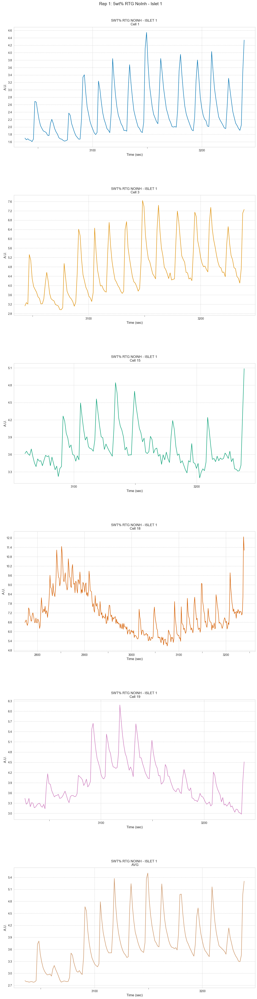

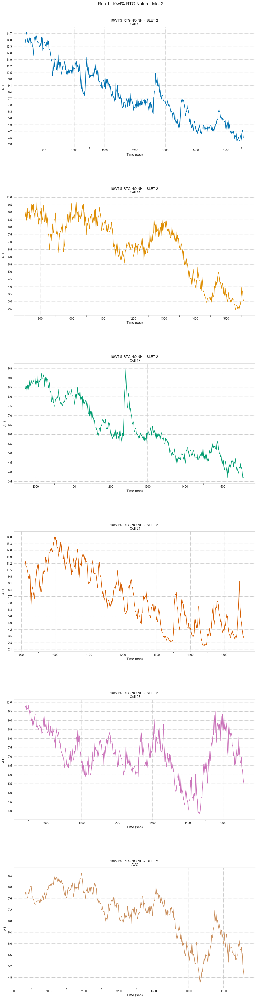

In [109]:
treatments = df.Treatment.unique()
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# loop through the length of tickers and keep track of index
for n, treat in enumerate(treatments):

    temp_df = df[df["Treatment"] == treat]
    temp_md = md[md["Treatment"] == treat]

    cells = temp_df["Cell #"].unique()

    #re-iniitialize the color pallet with each new set of plots:
    palette = sns.color_palette("colorblind", len(cells))

    #initialize plot
    plt.figure(figsize=(15, int(10*len(cells))))
    plt.subplots_adjust(hspace=0.4)
    plt.suptitle(f"Rep {rep}: {treat}", fontsize=15, y=0.9)

    for m, cell in enumerate(cells):



        cell_md = temp_md[temp_md["Example Cells"] == cell]

        wind_start = cell_md["11 mM End"].iloc[0]

        wind_end = cell_md["20 mM Stimulus"].iloc[0]


        plot_df = temp_df[temp_df["Cell #"] == cell]
        plot_df = plot_df[plot_df["Time (sec)"].between(wind_start, wind_end)]

        col_num = 1
        ax = plt.subplot(int(math.ceil(len(cells)/col_num)), col_num, m + 1)



        # filter df and plot ticker on the new subplot axis

        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("A.U.")
        #ax.legend()
        #ax.get_legend().remove()
        #ax.set_xlabel("")

        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m])
        # Set more frequent ticks on the x-axis

        ax.xaxis.set_major_locator(ticker.MultipleLocator(100))  # Adjust the locator value as needed

        yspacing = round_sig((plot_df["Normalized A.U."].max()/20))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(yspacing))
        ax.tick_params(axis='x', labelsize=10)  # Adjust the font size of x-axis tick labels
        ax.tick_params(axis='y', labelsize=10)  # Adjust the font size of x-axis tick labels

        # Enable and enlarge minor ticks for visibility
        ax.minorticks_on()
        # Add minor ticks on the x-axis
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=5)

        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        #ax.tick_params(axis='y', which='minor', bottom=True, top=False, length=5)


        ax.set_xlabel("Time (sec)", fontsize=12)
        ax.set_ylabel("A.U.", fontsize=12)
        # chart formatting
        ax.set_title(f"{treat.upper()} \n {cell}")



    plt.savefig(f"{folder}/second_phase/Rep{rep}_{treat}_sep.png", bbox_inches = "tight");






In [110]:
def smooth(x_vals, window = 5, loops = 5):

    new = np.zeros(len(x_vals))

    for j in range(loops):
        for i in range(len(x_vals)):

            start_window = i - window
            end_window = i + window +1

            if start_window < 0:
                start_window = 0


            new[i] = np.average(x_vals[start_window: end_window])

        x_vals = new

    return x_vals

In [111]:
def find_troffs(time, smoothed_signal):
    """
    Function to find the start indices of peaks (troffs) and inflection points in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peak_starts: Indices where peaks start.
    - trough_starts: Indices where troughs start.
    - inflection_points: Indices of inflection points.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_start_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Filter out the peak starts that are actually trough beginnings
    peaks = peak_start_indices[derivative[peak_start_indices] < 0]

    # Filter out the trough starts that are actually peak beginnings
    troughs = peak_start_indices[derivative[peak_start_indices] > 0]

    # Calculate the second derivative for finding inflection points
    # We reduce the size of the time array to match the length of the first derivative before calculating the second derivative
    second_derivative = np.diff(derivative) / np.diff(time)
    second_derivative = np.concatenate([[0, 0], second_derivative])  # Adding zeros to align with the length of the signal

    # Find where the second derivative changes sign (inflection points)
    inflection_points = np.where(np.diff(np.signbit(second_derivative)))[0]

    # Filter out the peak starts that are actually trough beginnings
    peak_starts = inflection_points[derivative[inflection_points] < 0]

    # Filter out the trough starts that are actually peak beginnings
    peak_ends = inflection_points[derivative[inflection_points] > 0]

    return peaks, troughs, peak_starts, peak_ends


In [112]:
def find_troffs(time, smoothed_signal):
    """
    Function to find the start indices of peaks (troffs) and inflection points in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peak_starts: Indices where peaks start.
    - trough_starts: Indices where troughs start.
    - inflection_points: Indices of inflection points.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_start_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Filter out the peak starts that are actually trough beginnings
    peaks = peak_start_indices[derivative[peak_start_indices] < 0]

    # Filter out the trough starts that are actually peak beginnings
    troughs = peak_start_indices[derivative[peak_start_indices] > 0]




    return peaks, troughs


In [113]:
import numpy as np



def test_find_troffs(time, smoothed_signal):
    """
    Function to find peaks, troughs, and inflection points in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peaks: Indices where peaks are detected.
    - troughs: Indices where troughs are detected.
    - inflection_points: Approximated indices of inflection points between peaks and troughs.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_trough_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Separate peak and trough indices
    peaks = peak_trough_indices[derivative[peak_trough_indices] < 0]
    troughs = peak_trough_indices[derivative[peak_trough_indices] > 0]

    """    # Calculate the second derivative for finding inflection points
    second_derivative = np.diff(derivative) / np.diff(time)
    second_derivative = np.concatenate([[0, 0], second_derivative])  # Adding zeros to align with the length of the signal"""

    start_peak = []
    end_peak = []

    a = peak_trough_indices[0]

    if a in peaks:
        derivs = derivative[0 : a]
        start_peak.append(np.argmax(derivs))

    if a in troughs:
        derivs = derivative[a : -1]
        end_peak.append(np.argmin(derivs))
        start_peak.append(0)

    for i in range(len(peak_trough_indices)-1):

        a = peak_trough_indices[i]

        if a in peaks:
            b = peak_trough_indices[i + 1]
            min_derivs = min(derivative[a : b])

            start_peak.append(derivative.index(min_derivs))

        if a in troughs:
            b = peak_trough_indices[i + 1]
            derivs = derivative[a : b]
            end_peak.append(np.argmax(derivs))

    a = peak_trough_indices[-1]

    if a in peaks:
        derivs = derivative[a : -1]
        start_peak.append(np.argmin(derivs))
        end_peak.append(-1)

    if a in troughs:
        derivs = derivative[a : -1]
        end_peak.append(np.argmax(derivs))


    return peaks, troughs, zip(start_peak, end_peak)


In [114]:
from scipy.signal import find_peaks

def find_troffs_and_peak_ranges(time, smoothed_signal):
    """
    Function to find the start indices of peaks, troughs, and peak ranges in the given signal.

    Parameters:
    - time: Array of time values.
    - smoothed_signal: Array of smoothed signal values.

    Returns:
    - peaks: Indices where peaks are detected.
    - troughs: Indices where troughs are detected.
    - peak_ranges: Nested list with each element being a pair denoting the start and end of each peak.
    """

    # Calculate the first derivative of the smoothed signal
    derivative = np.diff(smoothed_signal) / np.diff(time)
    derivative = np.concatenate([[0], derivative])  # Adding a zero to align with the length of the signal

    # Identify where the derivative changes sign for peaks and troughs
    peak_trough_indices = np.where(np.diff(np.signbit(derivative)))[0]

    # Separate peak and trough indices
    troughs = peak_trough_indices[derivative[peak_trough_indices] < 0]
    peaks = peak_trough_indices[derivative[peak_trough_indices] > 0]


    peak_ranges = []
    thresh = 0.5

    for i, b in enumerate(peak_trough_indices):

        if b in peaks:

            if i == 0:
                a = 0
            else:
                a = peak_trough_indices[i-1]



            delta_au = smoothed_signal.iloc[b] - smoothed_signal.iloc[a]

            half = smoothed_signal.iloc[a] + (1-thresh)*delta_au

            """            best_start = a
            for i in range(a, b):
                if smoothed_signal.iloc[i] == half:
                    best_start = i
                    break
                elif smoothed_signal.iloc[best_start] > half and smoothed_signal.iloc[i] < half:
                    break
                elif smoothed_signal.iloc[best_start] < half and smoothed_signal.iloc[i] > half:
                    break"""

            closest_start_index = min(enumerate(smoothed_signal.iloc[a:b]), key=lambda x: abs(x[1] - half))[0] + a


            if i >= (len(peak_trough_indices) -1):
                c = len(smoothed_signal)-1
            else:
                c = peak_trough_indices[i + 1]

            delta_au = smoothed_signal.iloc[c] - smoothed_signal.iloc[b]
            half = smoothed_signal.iloc[b] + thresh*delta_au

            closest_end_index = min(enumerate(smoothed_signal.iloc[b:c]), key=lambda x: abs(x[1] - half))[0] + b
            """            best_end = b
            for i in range(b, c):
                if smoothed_signal.iloc[i] == half:
                    best_end = i
                    break
                elif smoothed_signal.iloc[best_end] > half and smoothed_signal.iloc[i] < half:
                    break
                elif smoothed_signal.iloc[best_end] < half and smoothed_signal.iloc[i] > half:
                    break"""

            peak_ranges.append([closest_start_index, closest_end_index])



    return peaks, troughs, peak_ranges

# To use this function, provide the time array and the smoothed signal array
# Example usage: peaks, troughs, peak_ranges = find_troffs_and_peak_ranges(time, smoothed_signal)


In [115]:
md

,Unnamed: 0,Treatment,11 mM Stimulus,20 mM Stimulus,KCL Stimulus,11 mM End,Example Cells,Represent,End Option 1,End Option 2,End Option 3,Notes,Quality,End 11 mM 2nd Phase,Start 11 mM 2nd Phase,Unnamed: 15,Duty Quality,sample,Unnamed: 18
0,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1169.385,Cell 1,False,1169.385,1377.880,1666.665,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
1,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,629.370,Cell 2,False,629.370,998.445,1528.100,,3,NaN,NaN,NaN,NaN,NaN,NaN
2,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1212.120,Cell 3,False,1212.120,1381.765,1543.640,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN
3,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1364.930,Cell 4,False,617.715,1364.930,1563.065,small primary peak,2,NaN,NaN,NaN,NaN,NaN,NaN
4,0,NoRTG NoInh - 1 - Islet 1,480,1740,2460,1560.000,Cell 5,False,599.585,729.085,1373.995,Custom,3,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1140.000,Cell 34,False,1152.550,1410.255,1721.055,custom,1,NaN,NaN,NaN,NaN,NaN,NaN
223,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1301.475,Cell 35,False,1003.625,1301.475,1555.295,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN
224,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1489.250,Cell 36,False,1489.250,1625.225,1923.075,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN
225,18,10wt% RTG NoInh - Islet 3,900,2100,3300,1197.875,Cell Avg,False,1197.875,1622.635,1946.385,NaN,,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
if not os.path.exists(f"{folder}/on_off_periods_phase2"):

    # if the demo_folder directory is not present
    # then create it.

    os.makedirs(f"{folder}/on_off_periods_phase2")



/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/1632883067.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  examp.at[cell_md.index[0], "Duty Ratio"] = ratio
/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/1632883067.py:126: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  examp.at[cell_md.index[0], "Avg On (sec)"] = avg_on_time


ratio of NoRTG NoInh - 1 - Islet 2 Cell 1  0.5157232704402527
ratio of NoRTG NoInh - 1 - Islet 2 Cell 8  0.4367088607594948
ratio of NoRTG NoInh - 1 - Islet 2 Cell 14  0.5100671140939598
ratio of NoRTG NoInh - 1 - Islet 2 Cell 18  0.5220125786163533
ratio of NoRTG NoInh - 1 - Islet 2 Cell 20  0.4240506329113935
ratio of NoRTG NoInh - 1 - Islet 2 AVG  0.4634146341463415
ratio of NoRTG NoInh - 2 - Islet 2 Cell 3  0.4782608695652178
ratio of NoRTG NoInh - 2 - Islet 2 Cell 5  0.5054945054945034
ratio of NoRTG NoInh - 2 - Islet 2 Cell 7  0.46696035242290596
ratio of NoRTG NoInh - 2 - Islet 2 Cell 8  0.47105263157894967
ratio of NoRTG NoInh - 2 - Islet 2 Cell 13  0.46861924686192946
ratio of NoRTG NoInh - 2 - Islet 2 AVG  0.4888888888888916
ratio of 5wt% RTG NoInh - Islet 1 Cell 1  0.4774193548387097
ratio of 5wt% RTG NoInh - Islet 1 Cell 3  0.4900662251655699
ratio of 5wt% RTG NoInh - Islet 1 Cell 15  0.47826086956521485
ratio of 5wt% RTG NoInh - Islet 1 Cell 18  0.4846796657381625
ratio of

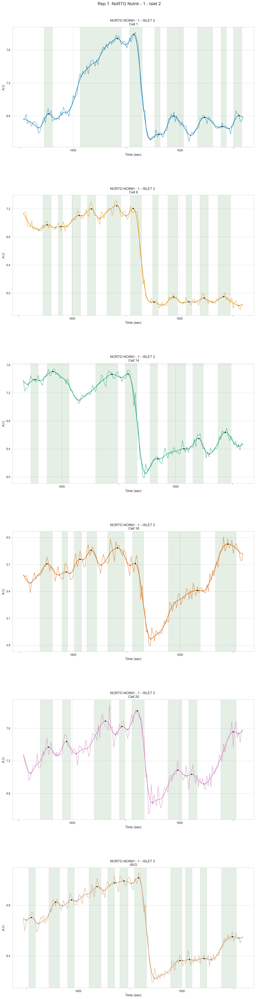

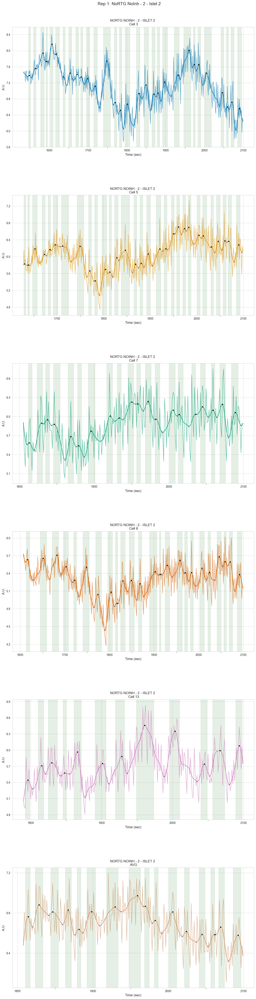

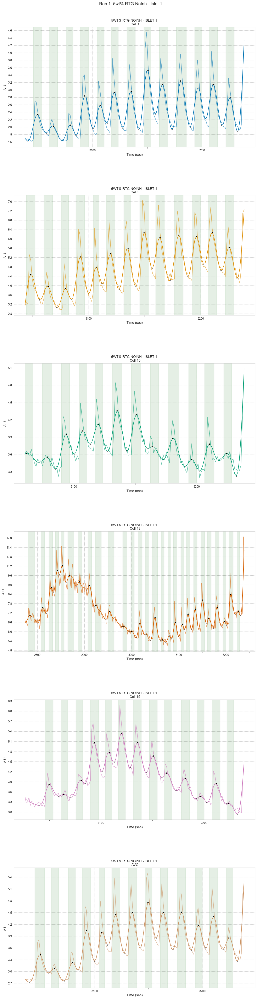

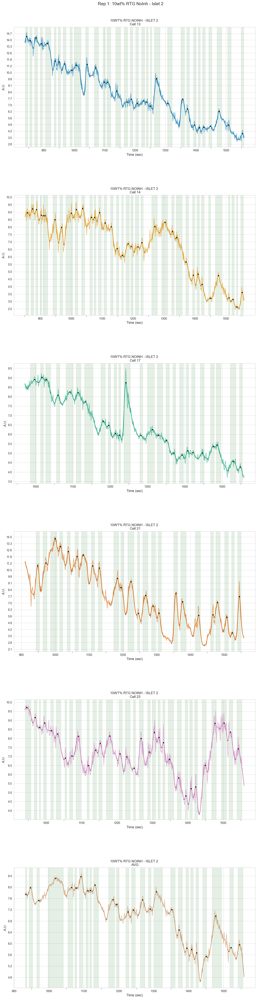

In [117]:
treatments = df.Treatment.unique()
sns.set_style("whitegrid", {'grid.linestyle': '--'})

# loop through the length of tickers and keep track of index
for n, treat in enumerate(treatments):

    temp_df = df[df["Treatment"] == treat]
    temp_md = md[md["Treatment"] == treat]

    cells = temp_df["Cell #"].unique()

    #re-iniitialize the color pallet with each new set of plots:
    palette = sns.color_palette("colorblind", len(cells))

    #initialize plot
    plt.figure(figsize=(15, int(10*len(cells))))
    plt.subplots_adjust(hspace=0.4)
    plt.suptitle(f"Rep {rep}: {treat}", fontsize=15, y=0.9)

    for m, cell in enumerate(cells):



        cell_md = temp_md[temp_md["Example Cells"] == cell]

        wind_start = cell_md["11 mM End"].iloc[0]
        wind_end = cell_md["20 mM Stimulus"].iloc[0]



        plot_df = temp_df[temp_df["Cell #"] == cell]
        plot_df = plot_df[plot_df["Time (sec)"].between(wind_start, wind_end)]

        col_num = 1
        ax = plt.subplot(int(math.ceil(len(cells)/col_num)), col_num, m + 1)
        #ax = plt.gca()
        # filter df and plot ticker on the new subplot axis

        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("A.U.")
        #ax.legend()
        #ax.get_legend().remove()
        #ax.set_xlabel("")

        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m], alpha = 0.75)
        # Set more frequent ticks on the x-axis
        au_change = plot_df["Normalized A.U."].max() - plot_df["Normalized A.U."].min()
        time_change = plot_df["Time (sec)"].max() - plot_df["Time (sec)"].min()


        window = 4
        loops = 3


        #smooth_vals = smooth(plot_df["Normalized A.U."], window, loops)
        #plot_df.insert(2, "Smoothed Normalized A.U.", smooth_vals ,True)
        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m])

        """        fs = 100
        sos = scipy.signal.iirfilter(1, Wn=[10, 15], fs=fs, btype="bandpass",
                             ftype="butter", output="sos")
        yfilt = scipy.signal.sosfilt(sos, plot_df["Normalized A.U."])
        plot_df["Smoothed Normalized A.U."] =  yfilt + 5
        peaks, props = scipy.signal.find_peaks(yfilt, distance=0.35*fs, height=0.0)"""

        mode = "medium"
        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m])

        if mode == "detailed":
            # Designing a Butterworth IIR filter for smoothing
            order = 3  # Filter order
            #note: adjust cutoff_freq to adjust smoothing
            cutoff_freq = 0.3  # Cutoff frequency, needs to be fine-tuned based on the data
            # Using a Butterworth low-pass filter

        if mode == "medium":
            # Designing a Butterworth IIR filter for smoothing
            order = 3  # Filter order
            #note: adjust cutoff_freq to adjust smoothing
            cutoff_freq = 0.2  # Cutoff frequency, needs to be fine-tuned based on the data
            # Using a Butterworth low-pass filter

        if mode == "smooth":
            #smoothest reasonable settings:
            order = 4  # Filter order
            cutoff_freq = 0.06
        if len(plot_df["Normalized A.U."]) < 12:
            print(cell, treat)
            print(plot_df["Normalized A.U."])
            continue

        b, a = scipy.signal.iirfilter(N=order, Wn=cutoff_freq, btype='low', ftype='butter')
        # Applying the filter to the Cell 1 data
        smoothed_AU = scipy.signal.filtfilt(b, a, plot_df["Normalized A.U."])
        plot_df.insert(2, "Smoothed Normalized A.U.", smoothed_AU ,True)

        yspacing = round_sig((plot_df["Normalized A.U."].max()/20))


        #sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m])

        """      cwt_peaks = scipy.signal.find_peaks_cwt(plot_df["Normalized A.U."], widths=np.arange(3, 30))
        print(cwt_peaks)
        peaks = []

        for peak in cwt_peaks:
            peaks.append(plot_df["Time (sec)"].iloc[peak])

            ax.plot(plot_df["Time (sec)"].iloc[peak], plot_df["Normalized A.U."].iloc[peak], marker=".", color="black", markersize=5)"""

        peaks, troughs, ons = find_troffs_and_peak_ranges(plot_df["Time (sec)"], plot_df["Smoothed Normalized A.U."])


        on_time = 0
        for spread in ons:
            start = plot_df["Time (sec)"].iloc[spread[0]]
            end = plot_df["Time (sec)"].iloc[spread[1]]
            ax.axvspan(start, end, alpha=0.1, color='darkgreen')
            on_time += end - start

        time_span =(max(plot_df["Time (sec)"]) - min(plot_df["Time (sec)"]))
        ratio = on_time/ time_span
        avg_on_time = on_time / len(ons)

        examp.at[cell_md.index[0], "Duty Ratio"] = ratio
        examp.at[cell_md.index[0], "Avg On (sec)"] = avg_on_time

        print(f"ratio of {treat} {cell} ",  ratio)

        """"
        for i, start in enumerate(peak_starts):

            start = plot_df["Time (sec)"].iloc[start]
            print("start " , start)

            if len(peak_ends) >= i:
                end = peak_ends[i]
                end = plot_df["Time (sec)"].iloc[end]
            else:
                end = plot_df["Time (sec)"].max()
                #print("end " , end)

            ax.axvspan(start, end, alpha=0.5, color='green')
        """


        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Normalized A.U.", color=palette[m], alpha = 0.6)
        sns.lineplot(data = plot_df,x = "Time (sec)", y = "Smoothed Normalized A.U.", color=palette[m], alpha = 1)

        for peak in peaks:
            ax.plot(plot_df["Time (sec)"].iloc[peak], plot_df["Smoothed Normalized A.U."].iloc[peak], marker="o", color="black", markersize=3)
        for trough in troughs:
            ax.plot(plot_df["Time (sec)"].iloc[trough], plot_df["Smoothed Normalized A.U."].iloc[trough], marker="o", color="darkgrey", markersize=3,
                    markeredgewidth=0.4, markeredgecolor="black")


        ax.xaxis.set_major_locator(ticker.MultipleLocator(100))  # Adjust the locator value as needed


        ax.yaxis.set_major_locator(ticker.MultipleLocator(yspacing))
        ax.tick_params(axis='x', labelsize=10)  # Adjust the font size of x-axis tick labels
        ax.tick_params(axis='y', labelsize=10)  # Adjust the font size of x-axis tick labels

        # Enable and enlarge minor ticks for visibility
        ax.minorticks_on()
        # Add minor ticks on the x-axis
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        ax.tick_params(axis='x', which='minor', bottom=True, top=False, length=5)

        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(2))  # Adds 1 minor tick between major ticks
        #ax.tick_params(axis='y', which='minor', bottom=True, top=False, length=5)


        ax.set_xlabel("Time (sec)", fontsize=12)
        ax.set_ylabel("A.U.", fontsize=12)
        # chart formatting
        ax.set_title(f"{treat.upper()} \n {cell}")



    plt.savefig(f"{folder}/on_off_periods_phase2/Rep{rep}_{treat}_graphs.png", bbox_inches = "tight");






In [118]:
examp

,Unnamed: 0,Treatment,11 mM Stimulus,20 mM Stimulus,KCL Stimulus,11 mM End,Example Cells,Represent,End Option 1,End Option 2,...,Notes,Quality,End 11 mM 2nd Phase,Start 11 mM 2nd Phase,Unnamed: 15,Duty Quality,sample,Unnamed: 18,Duty Ratio,Avg On (sec)
19,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1353.275,Cell 1,True,1353.275,NaN,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.515723,13.273750
26,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1354.570,Cell 8,True,1001.035,1354.570,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.436709,8.123182
32,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1366.225,Cell 14,True,1366.225,1547.525,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.510067,12.302500
36,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1353.275,Cell 18,True,1353.275,1495.725,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.522013,13.435625
38,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1354.570,Cell 20,True,1354.570,1526.805,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.424051,10.845625
41,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1346.800,AVG,True,1346.800,1539.755,...,,3,NaN,NaN,NaN,NaN,NaN,NaN,0.463415,8.947273
54,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1533.280,Cell 3,True,1533.280,1807.820,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,0.478261,9.021833
56,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1626.520,Cell 5,True,1626.520,1792.280,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,0.505495,7.942667
58,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1803.935,Cell 7,True,1669.255,1803.935,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,0.466960,6.863500
59,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1605.800,Cell 8,True,1605.800,1793.575,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.471053,9.658542


In [119]:
graph_df = examp.copy()
graph_df["Treatment"] = graph_df["Treatment"].str.split("-", expand=True)[0]
graph_df

,Unnamed: 0,Treatment,11 mM Stimulus,20 mM Stimulus,KCL Stimulus,11 mM End,Example Cells,Represent,End Option 1,End Option 2,...,Notes,Quality,End 11 mM 2nd Phase,Start 11 mM 2nd Phase,Unnamed: 15,Duty Quality,sample,Unnamed: 18,Duty Ratio,Avg On (sec)
19,1,NoRTG NoInh,780,1560,2460,1353.275,Cell 1,True,1353.275,NaN,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.515723,13.273750
26,1,NoRTG NoInh,780,1560,2460,1354.570,Cell 8,True,1001.035,1354.570,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.436709,8.123182
32,1,NoRTG NoInh,780,1560,2460,1366.225,Cell 14,True,1366.225,1547.525,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.510067,12.302500
36,1,NoRTG NoInh,780,1560,2460,1353.275,Cell 18,True,1353.275,1495.725,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.522013,13.435625
38,1,NoRTG NoInh,780,1560,2460,1354.570,Cell 20,True,1354.570,1526.805,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.424051,10.845625
41,1,NoRTG NoInh,780,1560,2460,1346.800,AVG,True,1346.800,1539.755,...,,3,NaN,NaN,NaN,NaN,NaN,NaN,0.463415,8.947273
54,3,NoRTG NoInh,900,2100,2760,1533.280,Cell 3,True,1533.280,1807.820,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,0.478261,9.021833
56,3,NoRTG NoInh,900,2100,2760,1626.520,Cell 5,True,1626.520,1792.280,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,0.505495,7.942667
58,3,NoRTG NoInh,900,2100,2760,1803.935,Cell 7,True,1669.255,1803.935,...,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,0.466960,6.863500
59,3,NoRTG NoInh,900,2100,2760,1605.800,Cell 8,True,1605.800,1793.575,...,,1,NaN,NaN,NaN,NaN,NaN,NaN,0.471053,9.658542


In [120]:
if not os.path.exists(f'{folder}/graphs'): 
      
     # if the demo_folder directory is not present then create it
                        
    os.makedirs(f'{folder}/graphs')

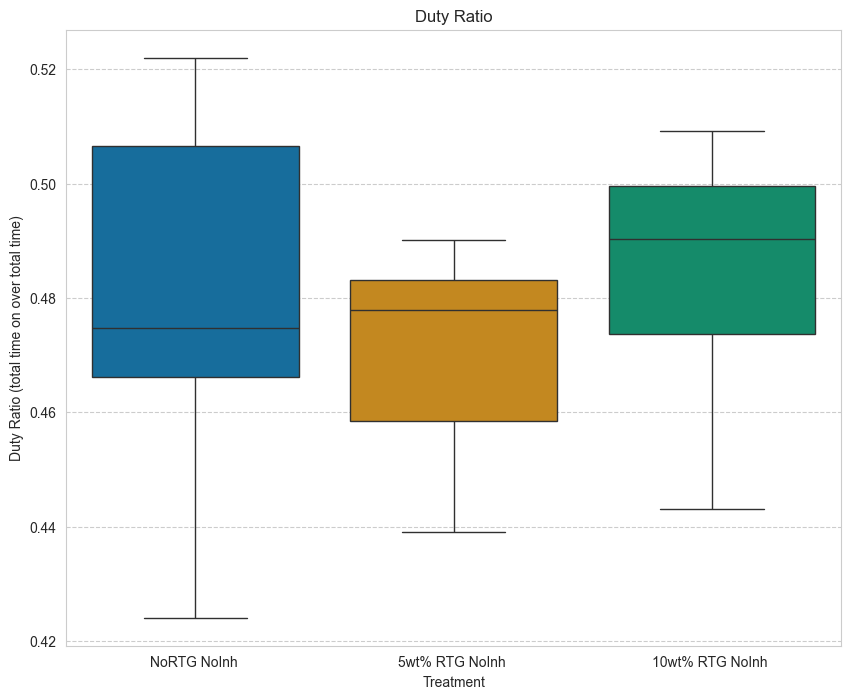

In [121]:
colors = sns.color_palette('colorblind', n_colors=len(graph_df["Treatment"].unique()))

plt.figure(figsize=(10, 8))
#sns.barplot(graph_df, x="Treatment", y="Duty Ratio", hue="Treatment", palette = colors)
sns.boxplot(graph_df, x="Treatment", y="Duty Ratio", hue="Treatment", palette = colors)
#sns.swarmplot(graph_df, x="Treatment", y="Duty Ratio", hue="Treatment", palette = colors)

plt.title("Duty Ratio", fontsize = 12)
plt.ylabel("Duty Ratio (total time on over total time)");

Text(0, 0.5, 'Average On Time (sec)')

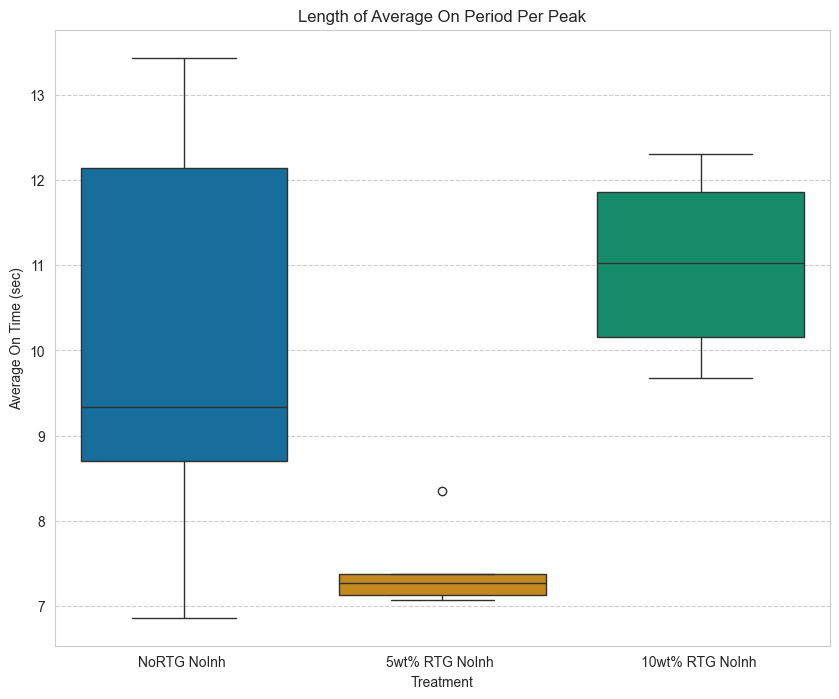

In [122]:
colors = sns.color_palette('colorblind', n_colors=len(graph_df["Treatment"].unique()))

plt.figure(figsize=(10, 8))
#sns.barplot(graph_df, x="Treatment", y="Avg On (sec)", hue="Treatment", palette = colors)
sns.boxplot(graph_df, x="Treatment", y="Avg On (sec)", hue="Treatment", palette = colors)

plt.title("Length of Average On Period Per Peak", fontsize = 12)
plt.ylabel("Average On Time (sec)")


In [123]:
def AUC(md_df, data, start = "11 mM Stimulus", end = "11 mM End", style="Trap", normal = False):
    # Initialize a list to store AUC values for each row in md_df but only works rn with only one typle of cell in each catagory
    AUCs = []

    # Iterate over each row in md_df
    for i, row in md_df.iterrows():
        # Filter 'data' dataframe to include only rows where 'Treatment' matches the current row in md_df
        min_df = data[(data["Treatment"] == row["Treatment"]) & (data["Cell #"] == row["Example Cells"])]
        # Further filter 'min_df' to include only rows where 'Time (sec)' is between 'Start' and 'End' of the current row in md_df
        min_df = min_df[min_df["Time (sec)"].between(row[start], row[end])]
                # Check if min_df is empty

        if min_df.empty:

            AUCs.append(np.nan)  # Append NaN or some other placeholder
            continue
        # Extract 'Time (sec)' column as x-values
        x = min_df["Time (sec)"].values

        if normal == False:
            # Calculate y-values by subtracting the baseline (first value) from 'Normalized A.U.'
            y = min_df['Normalized A.U.'] - min_df['Normalized A.U.'].iloc[0]
            print(y)
        if normal == True:
            y = min_df['Normalized A.U.']/min_df['Normalized A.U.'].iloc[0]




        # Choose the method to calculate AUC based on the 'type' parameter
        if style.lower() == "trap":
            # Calculate the AUC using the trapezoidal rule
            AUC_value = np.trapz(y, x)
        elif style.lower() == "rect":
            # Calculate the AUC using the rectangular method
            y = y.values
            AUC_value = 0
            for i in range(1, len(y)):
                # Calculate the width of each rectangle (delta_x)
                delta_x = (x[i] - x[i-1])
                # Height of the rectangle (delta_y)
                delta_y = y[i-1]
                # Incrementally add the area of each rectangle to 'AUC_value'
                AUC_value += delta_x * delta_y

        # Append the calculated AUC to the AUCs list
        AUCs.append(AUC_value)

    if style == "rect":
        md_df["AUC (rect)"] = AUCs
        return md_df

    # Add a new column 'AUC' to md_df containing the calculated AUCs
    md_df["AUC (trap)"] = AUCs
    # Return the modified md_df with AUC values
    return md_df


In [124]:
examp = AUC(examp.copy(), df.copy(), style="rect", normal = False)
examp = AUC(examp.copy(), df.copy(), style="trap")


42820    0.000000
42821   -0.029819
42822    1.577621
42823    2.359361
42824    1.637258
           ...   
43257    4.913003
43258    4.842146
43259    4.848755
43260    4.894866
43261    4.901937
Name: Normalized A.U., Length: 442, dtype: float64
58374    0.000000
58375   -0.128036
58376    1.288042
58377    2.120812
58378    1.902859
           ...   
58812    5.012143
58813    5.153704
58814    5.200123
58815    5.270673
58816    5.271749
Name: Normalized A.U., Length: 443, dtype: float64
71706    0.000000
71707   -0.069738
71708    0.582858
71709    0.970194
71710    0.907159
           ...   
72153    5.835568
72154    5.855819
72155    5.762978
72156    5.846691
72157    5.767969
Name: Normalized A.U., Length: 452, dtype: float64
80594    0.000000
80595   -0.102143
80596    0.457192
80597    0.792942
80598    0.944024
           ...   
81031    4.094786
81032    3.928031
81033    3.955539
81034    4.015353
81035    3.987419
Name: Normalized A.U., Length: 442, dtype: float64
8503

1034176    0.000000
1034177    0.024066
1034178    0.038820
1034179    0.016419
1034180    0.030271
             ...   
1034542    7.708457
1034543    7.695227
1034544    7.013744
1034545    6.581950
1034546    6.633134
Name: Normalized A.U., Length: 371, dtype: float64
42820    0.000000
42821   -0.029819
42822    1.577621
42823    2.359361
42824    1.637258
           ...   
43257    4.913003
43258    4.842146
43259    4.848755
43260    4.894866
43261    4.901937
Name: Normalized A.U., Length: 442, dtype: float64
58374    0.000000
58375   -0.128036
58376    1.288042
58377    2.120812
58378    1.902859
           ...   
58812    5.012143
58813    5.153704
58814    5.200123
58815    5.270673
58816    5.271749
Name: Normalized A.U., Length: 443, dtype: float64
71706    0.000000
71707   -0.069738
71708    0.582858
71709    0.970194
71710    0.907159
           ...   
72153    5.835568
72154    5.855819
72155    5.762978
72156    5.846691
72157    5.767969
Name: Normalized A.U., Length: 45

In [125]:
examp

,Unnamed: 0,Treatment,11 mM Stimulus,20 mM Stimulus,KCL Stimulus,11 mM End,Example Cells,Represent,End Option 1,End Option 2,...,End 11 mM 2nd Phase,Start 11 mM 2nd Phase,Unnamed: 15,Duty Quality,sample,Unnamed: 18,Duty Ratio,Avg On (sec),AUC (rect),AUC (trap)
19,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1353.275,Cell 1,True,1353.275,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.515723,13.273750,4823.868232,4827.042236
26,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1354.570,Cell 8,True,1001.035,1354.570,...,NaN,NaN,NaN,NaN,NaN,NaN,0.436709,8.123182,4093.263508,4096.676966
32,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1366.225,Cell 14,True,1366.225,1547.525,...,NaN,NaN,NaN,NaN,NaN,NaN,0.510067,12.302500,4226.033411,4229.768171
36,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1353.275,Cell 18,True,1353.275,1495.725,...,NaN,NaN,NaN,NaN,NaN,NaN,0.522013,13.435625,3987.265649,3989.847502
38,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1354.570,Cell 20,True,1354.570,1526.805,...,NaN,NaN,NaN,NaN,NaN,NaN,0.424051,10.845625,4586.721672,4590.061211
41,1,NoRTG NoInh - 1 - Islet 2,780,1560,2460,1346.800,AVG,True,1346.800,1539.755,...,NaN,NaN,NaN,NaN,NaN,NaN,0.463415,8.947273,3628.978280,3632.209121
54,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1533.280,Cell 3,True,1533.280,1807.820,...,NaN,NaN,NaN,NaN,NaN,NaN,0.478261,9.021833,4697.269544,4701.070145
56,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1626.520,Cell 5,True,1626.520,1792.280,...,NaN,NaN,NaN,NaN,NaN,NaN,0.505495,7.942667,4049.883772,4052.633792
58,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1803.935,Cell 7,True,1669.255,1803.935,...,NaN,NaN,NaN,NaN,NaN,NaN,0.466960,6.863500,3741.413350,3744.175258
59,3,NoRTG NoInh - 2 - Islet 2,900,2100,2760,1605.800,Cell 8,True,1605.800,1793.575,...,NaN,NaN,NaN,NaN,NaN,NaN,0.471053,9.658542,3528.375245,3531.144349


In [126]:
report_df = examp[["Treatment", "Duty Ratio", "Avg On (sec)", "Example Cells", "AUC (rect)", "AUC (trap)"]]
report_df


,Treatment,Duty Ratio,Avg On (sec),Example Cells,AUC (rect),AUC (trap)
19,NoRTG NoInh - 1 - Islet 2,0.515723,13.273750,Cell 1,4823.868232,4827.042236
26,NoRTG NoInh - 1 - Islet 2,0.436709,8.123182,Cell 8,4093.263508,4096.676966
32,NoRTG NoInh - 1 - Islet 2,0.510067,12.302500,Cell 14,4226.033411,4229.768171
36,NoRTG NoInh - 1 - Islet 2,0.522013,13.435625,Cell 18,3987.265649,3989.847502
38,NoRTG NoInh - 1 - Islet 2,0.424051,10.845625,Cell 20,4586.721672,4590.061211
41,NoRTG NoInh - 1 - Islet 2,0.463415,8.947273,AVG,3628.978280,3632.209121
54,NoRTG NoInh - 2 - Islet 2,0.478261,9.021833,Cell 3,4697.269544,4701.070145
56,NoRTG NoInh - 2 - Islet 2,0.505495,7.942667,Cell 5,4049.883772,4052.633792
58,NoRTG NoInh - 2 - Islet 2,0.466960,6.863500,Cell 7,3741.413350,3744.175258
59,NoRTG NoInh - 2 - Islet 2,0.471053,9.658542,Cell 8,3528.375245,3531.144349


In [127]:

report_df.to_excel(f"{folder}/Rep1_DutyRatio_and_AUC.xlsx")

In [128]:
print(f"{folder}/Rep1_DutyRatio_and_AUC.xlsx")

./rep1_data_analysis/Rep1_DutyRatio_and_AUC.xlsx


In [129]:
def normalize_AUC(column):

    return column

In [130]:
treatments

array(['NoRTG NoInh - 1 - Islet 2', 'NoRTG NoInh - 2 - Islet 2',
       '5wt% RTG NoInh - Islet 1', '10wt% RTG NoInh - Islet 2'],
      dtype=object)

In [131]:
md_plot = report_df.copy()

md_plot[["Treatment" , "Islet"]] = md_plot["Treatment"].str.split(" - ", n = 1, expand = True)

md_plot

,Treatment,Duty Ratio,Avg On (sec),Example Cells,AUC (rect),AUC (trap),Islet
19,NoRTG NoInh,0.515723,13.273750,Cell 1,4823.868232,4827.042236,1 - Islet 2
26,NoRTG NoInh,0.436709,8.123182,Cell 8,4093.263508,4096.676966,1 - Islet 2
32,NoRTG NoInh,0.510067,12.302500,Cell 14,4226.033411,4229.768171,1 - Islet 2
36,NoRTG NoInh,0.522013,13.435625,Cell 18,3987.265649,3989.847502,1 - Islet 2
38,NoRTG NoInh,0.424051,10.845625,Cell 20,4586.721672,4590.061211,1 - Islet 2
41,NoRTG NoInh,0.463415,8.947273,AVG,3628.978280,3632.209121,1 - Islet 2
54,NoRTG NoInh,0.478261,9.021833,Cell 3,4697.269544,4701.070145,2 - Islet 2
56,NoRTG NoInh,0.505495,7.942667,Cell 5,4049.883772,4052.633792,2 - Islet 2
58,NoRTG NoInh,0.466960,6.863500,Cell 7,3741.413350,3744.175258,2 - Islet 2
59,NoRTG NoInh,0.471053,9.658542,Cell 8,3528.375245,3531.144349,2 - Islet 2


In [132]:
order_key=['NoRTG NoInh', '2.5wt% RTG NoInh', '5wt% RTG NoInh', '10wt% RTG NoInh']
order =[]

for i in order_key:
    if i in list(md_plot["Treatment"]):
        order.append(i)
order

['NoRTG NoInh', '5wt% RTG NoInh', '10wt% RTG NoInh']

/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/368630602.py:3: UserWarning: The palette list has more values (25) than needed (3), which may not be intended.
  ax = sns.barplot(md_plot, x="Treatment", y="AUC (rect)", hue="Treatment", palette = colors, estimator = "mean", order=order)


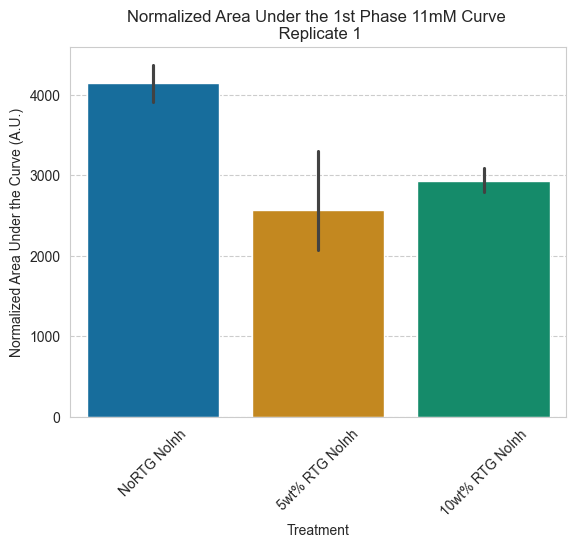

In [133]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.barplot(md_plot, x="Treatment", y="AUC (rect)", hue="Treatment", palette = colors, estimator = "mean", order=order)


ax.set_ylabel('Normalized Area Under the Curve (A.U.)')

ax.set_title(f"Normalized Area Under the 1st Phase 11mM Curve \n Replicate {rep}")

plt.xticks(rotation=45)


plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_AUC_barplot.png', bbox_inches = "tight");

In [134]:
#md_plot[["Rep", "Islet"]] =  md_plot["Islet"].str.split(" - ", n = 1, expand = True)

In [135]:
md_plot[md_plot["Treatment"] == "5wt% RTG NoInh"]

,Treatment,Duty Ratio,Avg On (sec),Example Cells,AUC (rect),AUC (trap),Islet
72,5wt% RTG NoInh,0.477419,7.371538,Cell 1,2193.657996,2193.699211,Islet 1
74,5wt% RTG NoInh,0.490066,7.371538,Cell 3,2533.086724,2534.073265,Islet 1
86,5wt% RTG NoInh,0.478261,7.122500,Cell 15,1778.552126,1779.750802,Islet 1
89,5wt% RTG NoInh,0.484680,8.345556,Cell 18,4263.512210,4265.946592,Islet 1
90,5wt% RTG NoInh,0.439024,7.172308,Cell 19,2340.972046,2342.285540,Islet 1
96,5wt% RTG NoInh,0.452229,7.072692,AVG,2333.315268,2333.944048,Islet 1


/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/3583939778.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.swarmplot(md_plot, x="Treatment", y="AUC (rect)", palette = colors, order=order)
/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/3583939778.py:3: UserWarning: The palette list has more values (25) than needed (3), which may not be intended.
  ax = sns.swarmplot(md_plot, x="Treatment", y="AUC (rect)", palette = colors, order=order)


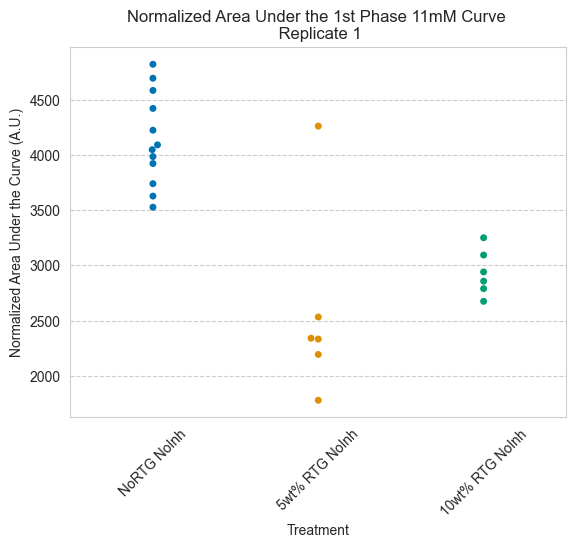

In [136]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.swarmplot(md_plot, x="Treatment", y="AUC (rect)", palette = colors, order=order)


ax.set_ylabel('Normalized Area Under the Curve (A.U.)')

ax.set_title(f"Normalized Area Under the 1st Phase 11mM Curve \n Replicate {rep}")

plt.xticks(rotation=45)

plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_AUC_swarmplot.png', bbox_inches = "tight");
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), labels = ['Rep 1','Rep 2','Rep 3']);

In [137]:
md_plot = md_plot.loc[:,~md_plot.apply(lambda x: x.duplicated(),axis=1).all()].copy()

In [138]:
md_plot

,Treatment,Duty Ratio,Avg On (sec),Example Cells,AUC (rect),AUC (trap),Islet
19,NoRTG NoInh,0.515723,13.273750,Cell 1,4823.868232,4827.042236,1 - Islet 2
26,NoRTG NoInh,0.436709,8.123182,Cell 8,4093.263508,4096.676966,1 - Islet 2
32,NoRTG NoInh,0.510067,12.302500,Cell 14,4226.033411,4229.768171,1 - Islet 2
36,NoRTG NoInh,0.522013,13.435625,Cell 18,3987.265649,3989.847502,1 - Islet 2
38,NoRTG NoInh,0.424051,10.845625,Cell 20,4586.721672,4590.061211,1 - Islet 2
41,NoRTG NoInh,0.463415,8.947273,AVG,3628.978280,3632.209121,1 - Islet 2
54,NoRTG NoInh,0.478261,9.021833,Cell 3,4697.269544,4701.070145,2 - Islet 2
56,NoRTG NoInh,0.505495,7.942667,Cell 5,4049.883772,4052.633792,2 - Islet 2
58,NoRTG NoInh,0.466960,6.863500,Cell 7,3741.413350,3744.175258,2 - Islet 2
59,NoRTG NoInh,0.471053,9.658542,Cell 8,3528.375245,3531.144349,2 - Islet 2


/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/2848180492.py:3: UserWarning: The palette list has more values (25) than needed (4), which may not be intended.
  ax = sns.swarmplot(md_plot, x="Treatment", y="Duty Ratio", hue="Islet", palette = colors, order=order)


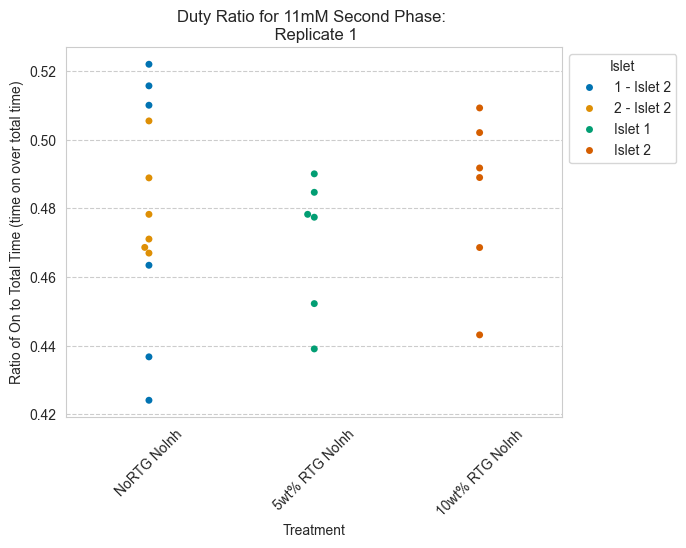

In [139]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.swarmplot(md_plot, x="Treatment", y="Duty Ratio", hue="Islet", palette = colors, order=order)

ax.set_ylabel('Ratio of On to Total Time (time on over total time)')

ax.set_title(f"Duty Ratio for 11mM Second Phase: \n Replicate {rep}")

plt.xticks(rotation=45)

plt.savefig(f"{folder}/Rep{rep}_Duty Ratio.png", bbox_inches = "tight")
plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_duty_ratio_swarmplot.png', bbox_inches = "tight");
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1));

/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/798943453.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(md_plot, x="Treatment", y="Duty Ratio", palette = colors, order=order)
/var/folders/l2/ql1ypp8x1217sf5tb_mw1cmh0000gp/T/ipykernel_45714/798943453.py:3: UserWarning: The palette list has more values (25) than needed (3), which may not be intended.
  ax = sns.barplot(md_plot, x="Treatment", y="Duty Ratio", palette = colors, order=order)


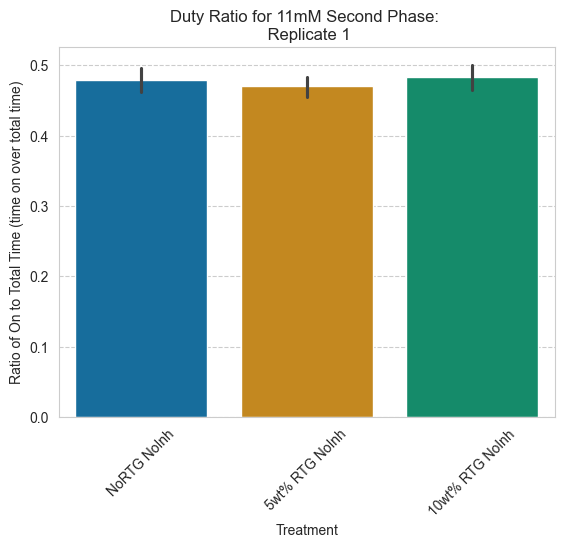

In [140]:
colors = sns.color_palette('colorblind', n_colors=len(treat))

ax = sns.barplot(md_plot, x="Treatment", y="Duty Ratio", palette = colors, order=order)


ax.set_ylabel('Ratio of On to Total Time (time on over total time)')

ax.set_title(f"Duty Ratio for 11mM Second Phase: \n Replicate {rep}")

plt.xticks(rotation=45)

plt.savefig(f'{folder}/graphs/Rep{rep}_11mM_curve_duty_ratio_barplot.png', bbox_inches = "tight");
